In [0]:
!git clone https://github.com/Jakobovski/free-spoken-digit-dataset.git

Cloning into 'free-spoken-digit-dataset'...
remote: Enumerating objects: 9, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 3166 (delta 3), reused 5 (delta 0), pack-reused 3157
Receiving objects: 100% (3166/3166), 23.93 MiB | 30.32 MiB/s, done.
Resolving deltas: 100% (72/72), done.


In [0]:
!unzip audio_examples.zip
!unzip raw_data.zip

Archive:  audio_examples.zip
   creating: audio_examples/
  inflating: audio_examples/chime.wav  
  inflating: audio_examples/example_train.wav  
  inflating: audio_examples/insert_reference.wav  
  inflating: audio_examples/my_audio.wav  
  inflating: audio_examples/train_reference.wav  
Archive:  raw_data.zip
   creating: raw_data/
   creating: raw_data/backgrounds/
  inflating: raw_data/backgrounds/1.wav  
  inflating: raw_data/backgrounds/2.wav  
   creating: raw_data/negatives/
  inflating: raw_data/negatives/1.wav  
  inflating: raw_data/negatives/1_0.wav  
  inflating: raw_data/negatives/2.wav  
  inflating: raw_data/negatives/2_1.wav  
  inflating: raw_data/negatives/3.wav  
  inflating: raw_data/negatives/3_2.wav  
  inflating: raw_data/negatives/4.wav  
  inflating: raw_data/negatives/4_0.wav  
  inflating: raw_data/negatives/5.wav  
  inflating: raw_data/negatives/5_1.wav  
  inflating: raw_data/negatives/flute.wav  
  inflating: raw_data/negatives/piano.wav  
  inflating: r

In [0]:
!cp -a free-spoken-digit-dataset/recordings raw_data/

In [0]:
import wave, os, glob
path = 'raw_data/activates'
for filename in glob.glob(os.path.join(path, '*.wav')):
  os.remove(filename)

path = 'raw_data/negatives'
for filename in glob.glob(os.path.join(path, '*.wav')):
  os.remove(filename)

In [0]:
import wave, os, glob
from shutil import copyfile

path = 'raw_data/recordings'
for filename in glob.glob(os.path.join(path, '*.wav')):
  #print(filename)
  name = filename.split('/')[2]
  if name.split('_')[0]=="1":
    copyfile(filename, 'raw_data/activates/'+name)
  else:
    copyfile(filename, 'raw_data/negatives/'+name)

In [0]:
!pip3 install -r requirements.txt

In [0]:
#!wget https://github.com/Tony607/Keras-Trigger-Word/releases/download/V0.1/Data.zip
#!unzip Data.zip

In [0]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
from random import seed
from random import randint
import IPython
from td_utils import *
%matplotlib inline

In [0]:
IPython.display.Audio("audio_examples/example_train.wav")

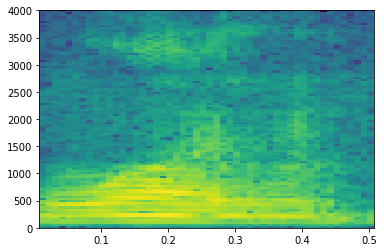

In [0]:
x = graph_spectrogram("raw_data/activates/1_jackson_0.wav")

In [0]:

_, data = wavfile.read("audio_examples/example_train.wav")
print("Time steps in audio recording before spectrogram", data[:,0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (441000,)
Time steps in input after spectrogram (101, 50)


In [0]:
Tx = 5511 #5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram
Ty = 1371 # The number of time steps in the output of our model

In [0]:
def salvage(filename):
    # Trim or pad audio segment to 10000ms
    #padding = AudioSegment.silent(duration=2000)
    segment = AudioSegment.from_wav(filename)[:]
    #ysegment = padding.overlay(segment)
    #segment,_ = insert_audio_clip(background,file,[])
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')

In [0]:
#salvage("raw_data/activates/1.wav")
#salvage("raw_data/activates/2.wav")
#salvage("raw_data/activates/3.wav")
#salvage("raw_data/activates/4.wav")
#salvage("raw_data/activates/5.wav")

In [0]:


# Load audio segments using pydub 
activates, negatives, backgrounds = load_raw_audio()

print("background len: " + str(len(backgrounds[0])))    # Should be 10,000, since it is a 10 sec clip
print("activate[0] len: " + str(len(activates[0])))     # Maybe around 1000, since an "activate" audio clip is usually around 1 sec (but varies a lot)
print("activate[1] len: " + str(len(activates[1])))     # Different "activate" clips can have different lengths

print("activate[2] len: " + str(len(activates[2])))

background len: 10000
activate[0] len: 263
activate[1] len: 312
activate[2] len: 431


In [0]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms-1)   # Make sure segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [0]:
def is_overlapping(segment_time, previous_segments):
    """
    Checks if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    ### START CODE HERE ### (≈ 4 line)
    # Step 1: Initialize overlap as a "False" flag. (≈ 1 line)
    overlap = False
    
    # Step 2: loop over the previous_segments start and end times.
    # Compare start/end times and set the flag to True if there is an overlap (≈ 3 lines)
    # There should be a difference of 100 between the ends, to have no overlaping Ys
    for previous_start, previous_end in previous_segments:
        if segment_start <= previous_end + 100 and segment_end >= previous_start - 100:
            overlap = True
    ### END CODE HERE ###

    return overlap


In [0]:
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Insert a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
    new_background = background
    
    ### START CODE HERE ### 
    # Step 1: Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip. (≈ 1 line)
    segment_time = get_random_time_segment(segment_ms)
    i = 0
    
    # Step 2: Check if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap. (≈ 2 lines)
    while is_overlapping(segment_time, previous_segments) and i<100:
        segment_time = get_random_time_segment(segment_ms)
        i += 1

    
    # Step 3: Add the new segment_time to the list of previous_segments (≈ 1 line)
    if i<100:
      previous_segments.append(segment_time)
    ### END CODE HERE ###
    
    # Step 4: Superpose audio segment and background
      new_background = background.overlay(audio_clip, position = segment_time[0])
    else : 
      segment_time = previous_segments[0]
    
    return new_background, segment_time

In [0]:
len(activates[4])

219

In [0]:
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], negatives[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (2915, 3403)


In [0]:
len(audio_clip)

10000

In [0]:
def insert_ones(y, segment_end_ms,segment_time):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 followinf labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    segment_time_y = int(segment_time * Ty / 10000.0)
    
    # Add 1 to the correct index in the background label (y)
    ### START CODE HERE ### (≈ 3 lines)
    #for i in range(segment_end_y + 1, segment_end_y + 51):
    for i in range(segment_end_y - segment_time_y -50, segment_end_y+51):
        if i < Ty:
            y[0, i] = 1
    ### END CODE HERE ###
    
    return y

sanity checks: 1.0 0.0 0.0


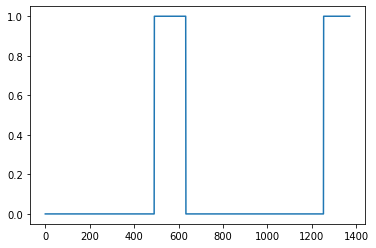

In [0]:
arr1 = insert_ones(np.zeros((1, Ty)), 10000,500)
plt.plot(insert_ones(arr1, 4251,300)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])


In [0]:

	
# seed the pseudorandom number generator
from random import seed
from random import randint
def create_training_example(background, activates, negatives):
    """

    """
    
    # Set the random seed
    #np.random.seed(300)
    seed()
    
    # Make background quieter
    background = background -30

    ### START CODE HERE ###
    # Step 1: Initialize y (label vector) of zeros (≈ 1 line)
    y = np.zeros((1, Ty))

    # Step 2: Initialize segment times as empty list (≈ 1 line)
    previous_segments = []
    ### END CODE HERE ###
    
    # Select 0-3 random "activate" audio clips from the entire list of "activates" recordings
    #number_of_activates = np.random.randint(0, 5)
    number_of_activates = randint(1, 4)
    print(number_of_activates)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    ### START CODE HERE ### (≈ 3 lines)
    # Step 3: Loop over randomly selected "activate" clips and insert in background
    for random_activate in random_activates:
        # Insert the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieve segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        distance_speech = segment_end - segment_start
        # Insert labels in "y"
        y = insert_ones(y, segment_end_ms=segment_end,segment_time=distance_speech)
    ### END CODE HERE ###

    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = randint(1, 5)
    print(number_of_negatives)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    ### START CODE HERE ### (≈ 2 lines)
    # Step 4: Loop over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Insert the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
    ### END CODE HERE ###
    
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    print("File (train.wav) was saved in your directory.")
    
    # Get and plot spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

In [0]:

np.random.randint(low=0, high=10000-1600-1)


3291

4
5
File (train.wav) was saved in your directory.


/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


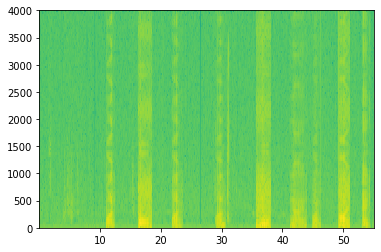

In [0]:
x, y = create_training_example(backgrounds[0], activates, negatives)

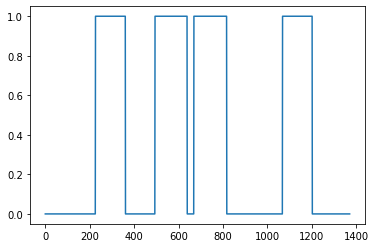

In [0]:
plt.plot(y[0,:])

In [0]:
len(backgrounds)
len(x[0])

5511

In [0]:

IPython.display.Audio("train.wav")

In [0]:
X = []
Y = []
x_test = []
y_test = []


2
1
File (train.wav) was saved in your directory.
3
4
File (train.wav) was saved in your directory.
4
1
File (train.wav) was saved in your directory.


/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


2
2
File (train.wav) was saved in your directory.
2
5
File (train.wav) was saved in your directory.
2
3
File (train.wav) was saved in your directory.
4
4
File (train.wav) was saved in your directory.
3
2
File (train.wav) was saved in your directory.
2
3
File (train.wav) was saved in your directory.
4
2
File (train.wav) was saved in your directory.
2
1
File (train.wav) was saved in your directory.
3
2
File (train.wav) was saved in your directory.
3
5
File (train.wav) was saved in your directory.
2
1
File (train.wav) was saved in your directory.
4
3
File (train.wav) was saved in your directory.
2
5
File (train.wav) was saved in your directory.
2
3
File (train.wav) was saved in your directory.
1
4
File (train.wav) was saved in your directory.
1
2
File (train.wav) was saved in your directory.
1
5
File (train.wav) was saved in your directory.
3
3
File (train.wav) was saved in your directory.
4
4
File (train.wav) was saved in your directory.
3
2
File (train.wav) was saved in your directory.


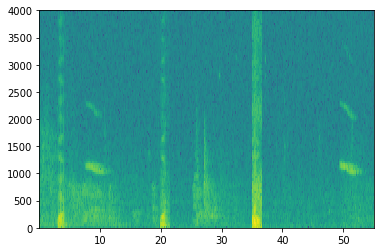

In [0]:
for background in backgrounds:
  for i in range(0,500):
    x, y = create_training_example(background, activates, negatives)
    if i < 400:
      X.append(x)
      Y.append(y)
    else :
      x_test.append(x)
      y_test.append(y)

    

In [0]:
y_test = np.array(y_test) #.reshape()
y_test = np.reshape(y_test,(200,Ty,1))
y_test.shape
x_test = np.array(x_test) 
x_test = np.reshape(x_test,(200,5511,101))
x_test.shape

(200, 5511, 101)

In [0]:
Y = np.array(Y) #.reshape()
Y = np.reshape(Y,(800,Ty,1))
Y.shape
X = np.array(X) 
X = np.reshape(X,(800,5511,101))
X.shape


(800, 5511, 101)

In [0]:
!pip3 install keras-metrics

In [0]:
from keras.layers import Input
from keras.layers import Conv1D, Conv2D, MaxPooling1D
from keras.layers import BatchNormalization
from keras.layers import Activation
from keras.layers import Dropout
from keras.layers import GRU
from keras.layers import TimeDistributed
from keras.layers import Dense
from keras.models import Model
from keras.models import load_model
from keras.optimizers import Adam
import keras
import keras_metrics
from keras import backend as K

In [0]:
import numpy as np
from keras.callbacks import Callback
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score
class Metrics(Callback):
  def on_train_begin(self, logs={}):
    self.val_f1s = []
    self.val_recalls = []
    self.val_precisions = []
 
  def on_epoch_end(self, epoch, logs={}):
    val_predict = (np.asarray(self.model.predict(self.model.validation_data[0]))).round() 
    val_targ = self.model.validation_data[1]
    _val_f1 = f1_score(val_targ, val_predict)
    _val_recall = recall_score(val_targ, val_predict)
    _val_precision = precision_score(val_targ, val_predict)
    self.val_f1s.append(_val_f1)
    self.val_recalls.append(_val_recall)
    self.val_precisions.append(_val_precision)
    print(" — val_f1: " + _val_f1 + "— val_precision: "+ _val_precision +"— val_recall "+_val_recall)
    return
 
metrics = Metrics()

In [0]:
def get_f_score(y,y_pred):
  precision = keras_metrics.precision()
  recall = keras_metrics.recall()
  return 2 * ((precision * recall) / (precision + recall))

In [0]:
def relu_advanced(x):
    return K.relu(x, alpha=0.0, max_value=1.0, threshold=0.95)

In [0]:
def model(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    ### START CODE HERE ###
    
    # Step 1: CONV layer (≈4 lines)
    X = Conv1D(300, kernel_size=14, strides=2)(X_input)                                 # CONV1D
    X = BatchNormalization()(X)                                 # Batch normalization
    X = Activation('relu')(X)                                 # ReLu activation
    X = MaxPooling1D(pool_size=2, strides=1, padding='valid', data_format='channels_last')(X)
    X = Dropout(0.2)(X)                                 # dropout (use 0.8)

    X = Conv1D(300, kernel_size=5, strides=2)(X)                                 # CONV1D
    X = BatchNormalization()(X)                                 # Batch normalization
    X = Activation('relu')(X)                                 # ReLu activation
    X = MaxPooling1D(pool_size=2, strides=1, padding='valid', data_format='channels_last')(X)
    X = Dropout(0.2)(X) 

    # Step 2: First GRU Layer (≈4 lines)
    X = GRU(units = 128, return_sequences = True)(X) # GRU (use 128 units and return the sequences)
    X = Dropout(0.2)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                 # Batch normalization
    
    # Step 3: Second GRU Layer (≈4 lines)
    X = GRU(units = 128, return_sequences = True)(X)   # GRU (use 128 units and return the sequences)
    X = Dropout(0.2)(X)                                 # dropout (use 0.8)
    X = BatchNormalization()(X)                                  # Batch normalization
    X = Dropout(0.2)(X)                                  # dropout (use 0.8)



    
    # Step 4: Time-distributed dense layer (≈1 line)
    #X = TimeDistributed(Dense(1, activation = "sigmoid"))(X) # time distributed  (sigmoid)
    #X = keras.activations.relu(x, alpha=0.0, max_value=1.0, threshold=0.3) (X)
    X = TimeDistributed(Dense(1, activation = relu_advanced))(X) # time distributed  (relu)
    #X = Dense(1, activation = "sigmoid") (X)


    ### END CODE HERE ###

    model = Model(inputs = X_input, outputs = X)
    
    return model

In [0]:
model = model(input_shape = (Tx, n_freq))

In [0]:
model.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         (None, 5511, 101)         0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 2749, 300)         424500    
_________________________________________________________________
batch_normalization_17 (Batc (None, 2749, 300)         1200      
_________________________________________________________________
activation_9 (Activation)    (None, 2749, 300)         0         
_________________________________________________________________
max_pooling1d_9 (MaxPooling1 (None, 2748, 300)         0         
_________________________________________________________________
dropout_21 (Dropout)         (None, 2748, 300)         0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 1372, 300)         4503

In [0]:
#model = load_model("./trigger_word_1_epoch_669.h5",custom_objects = {"relu_advanced": relu_advanced,"binary_precision":keras_metrics.precision(),"binary_recall": keras_metrics.recall()})

In [0]:
#for layer in model.layers:
#    layer.trainable = True

#for layer in model.layers:
 #   print(layer, layer.trainable)

#model.layers[0].trainable = False
#model.layers[1].trainable = False
#print(model.layers[1], model.layers[1].trainable)

In [0]:
#model.fit(X, Y, batch_size = 15, epochs=1)

In [0]:
#opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
opt = keras.optimizers.SGD(lr=0.0001, momentum=0.0, nesterov=False)

#opt = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, decay=0.01)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["binary_accuracy",keras_metrics.precision(), keras_metrics.recall(),keras_metrics.f1_score()])
#model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [0]:
history = model.fit(X, Y, batch_size = 200, epochs=50,validation_data=(x_test, y_test))

Train on 800 samples, validate on 200 samples
Epoch 1/50
800/800 [==============================] - 29s 36ms/step - loss: 5.4512 - binary_accuracy: 0.6533 - precision: 0.2605 - recall: 0.1650 - f1_score: 0.2020 - val_loss: 4.5732 - val_binary_accuracy: 0.7156 - val_precision: 0.2298 - val_recall: 0.0200 - val_f1_score: 0.0367
Epoch 2/50
800/800 [==============================] - 26s 33ms/step - loss: 5.3948 - binary_accuracy: 0.6572 - precision: 0.2600 - recall: 0.1563 - f1_score: 0.1952 - val_loss: 4.6128 - val_binary_accuracy: 0.7131 - val_precision: 0.2340 - val_recall: 0.0247 - val_f1_score: 0.0447
Epoch 3/50
800/800 [==============================] - 27s 34ms/step - loss: 5.3657 - binary_accuracy: 0.6594 - precision: 0.2591 - recall: 0.1509 - f1_score: 0.1908 - val_loss: 4.6238 - val_binary_accuracy: 0.7123 - val_precision: 0.2343 - val_recall: 0.0261 - val_f1_score: 0.0469
Epoch 4/50
800/800 [==============================] - 26s 33ms/step - loss: 5.3508 - binary_accuracy: 0.6604

In [0]:
print(history.history.keys())

dict_keys(['val_loss', 'val_binary_accuracy', 'val_precision', 'val_recall', 'val_f1_score', 'loss', 'binary_accuracy', 'precision', 'recall', 'f1_score'])


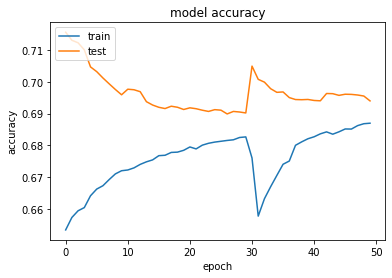

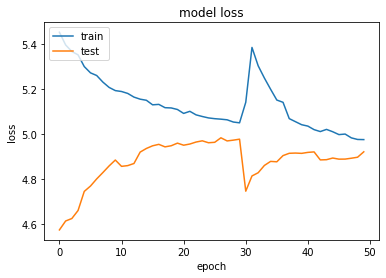

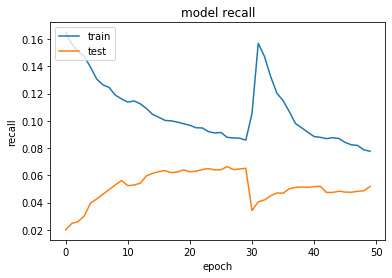

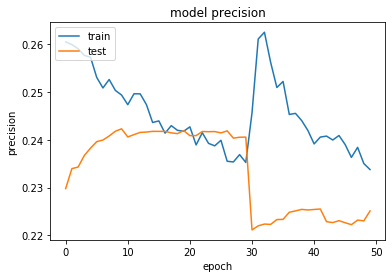

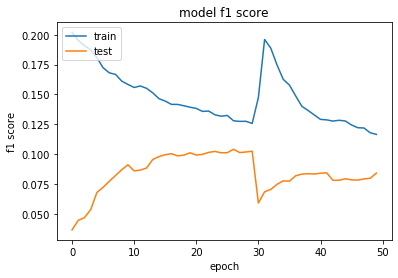

In [0]:

# summarize history for accuracy
plt.plot(history.history['binary_accuracy'])
plt.plot(history.history['val_binary_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for recall
plt.plot(history.history['recall'])
plt.plot(history.history['val_recall'])
plt.title('model recall')
plt.ylabel('recall')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for precision
plt.plot(history.history['precision'])
plt.plot(history.history['val_precision'])
plt.title('model precision')
plt.ylabel('precision')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for f1_score
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])
plt.title('model f1 score')
plt.ylabel('f1 score')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [0]:
model.evaluate(x_test, y_test)
#print("Dev set accuracy = ", acc)

200/200 [==============================] - 5s 23ms/step


[2.5249846839904784,
 0.8415827894210816,
 0.0253594249200012,
 0.020800917205712876,
 0.022855036644096126]

In [0]:
model.save("trigger_word_1_epoch_700.h5")

KeyboardInterrupt: ignored

In [0]:
# Preprocess the audio to the correct format
def preprocess_audio(file,background,filename):
    # Trim or pad audio segment to 10000ms
    #padding = AudioSegment.silent(duration=10000)
    #segment = AudioSegment.from_wav(filename)[:10000]
    #segment = padding.overlay(segment)
    segment,_ = insert_audio_clip(background,file,[])
    # Set frame rate to 44100
    segment = segment.set_frame_rate(44100)
    # Export as wav
    segment.export(filename, format='wav')


In [0]:
#preprocess_audio(activates[1],backgrounds[0],"raw_data/1.wav")

In [0]:
IPython.display.Audio("train.wav") # listen to the audio you uploaded

In [0]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)

    x = graph_spectrogram(filename)
    # the spectogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    f_prediction = []

    for pred in predictions :
      #print(pred)
      for p in pred:
        #print(p)
        if p<0.9:
          f_prediction.append(p)
          #print(p)
        else :
          #print(p)
          f_prediction.append(p)
    #predictions = predictions  * 10
    
    plt.subplot(2, 1, 2)
    #print(f_prediction)
    #plt.plot(predictions[0,:,0],color='red')
    plt.plot(f_prediction,color='red')
    plt.ylabel('probability')
    plt.show()
    return f_prediction

In [0]:
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = len(predictions)
    # Step 1: Initialize the number of consecutive output steps to 0
    consecutive_timesteps = 0
    # Step 2: Loop over the output steps in the y
    for i in range(Ty):
        # Step 3: Increment consecutive output steps
        consecutive_timesteps += 1
        # Step 4: If prediction is higher than the threshold and more than 75 consecutive output steps have passed
        if predictions[i] > threshold  and consecutive_timesteps > 75:
            # Step 5: Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds)*1000)
            # Step 6: Reset consecutive output steps to 0
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

3
3
File (train.wav) was saved in your directory.


/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


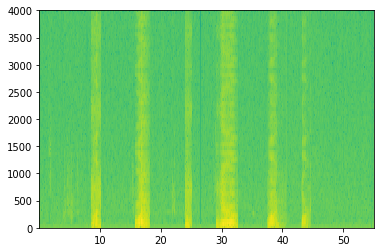

In [0]:
x, y = create_training_example(backgrounds[0], activates, negatives)

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:7747: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


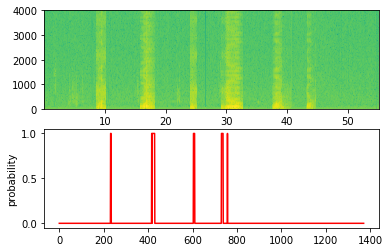

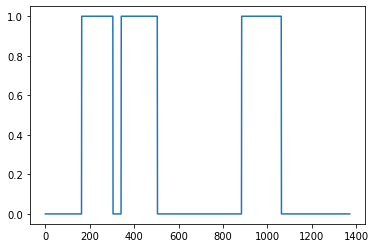

In [0]:
filename = "train.wav"

prediction = detect_triggerword(filename)
#print(prediction)

#for pred in prediction : 
 # for p in pred:
 #   if p >0.6:
     # print(p)
plt.plot(y[0,:])
chime_on_activate(filename, prediction, 0.98)
IPython.display.Audio("./chime_output.wav")